In [1]:
pip install kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 1.1 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/167.3 kB 2.6 MB/s eta 0:00:00a 0:00:01
  Created wheel for kaggle: filename=kaggle-1.6.17-py3-none-any.whl size=105802 sha256=5a848174f383c696cfb3334d25c9d6963ee60436430ef7bec64e7c979d852bc4
  Stored in directory: /Users/madhumithaganji/Library/Caches/pip/wheels/9f/af/22/bf406f913dc7506a485e60dce8143741abd0a92a19337d83a3
Successfully built kaggle
  Attempting uninstall: certifi
    Found existing installation: certifi 2021.10.8
    Uninstalling certifi-2021.10.8:
      Successfully uninstalled certifi-2021.10.8

[notice] A new release of pip is available: 23.3.2 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
hatch run install-deps


SyntaxError: invalid syntax (3945633719.py, line 1)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
%matplotlib inline
import gc
import warnings
warnings.filterwarnings('ignore')

In [2]:
#load the competition dataset
train = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/train.csv', parse_dates = ['date'])
test = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/test.csv', parse_dates = ['date'])
transactions = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/transactions.csv', parse_dates = ['date'])
stores = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/stores.csv')
oil = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/oil.csv')
holidays = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv', parse_dates = ['date'])


In [3]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [4]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [5]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [6]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [7]:
temp = pd.merge(train.groupby(['date', 'store_nbr'], as_index = False)['sales'].sum(), transactions, how = 'left')
print(temp.corr().sales['transactions'])


0.8373836801431865


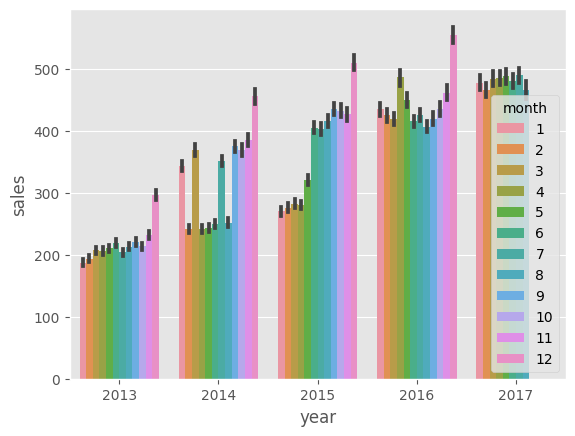

In [8]:
a = train.copy()
a['month'] = a.date.dt.month
a['year'] = a.date.dt.year
sns.barplot(a,x = 'year',  y='sales', hue = 'month')
plt.show()

<Axes: xlabel='date'>

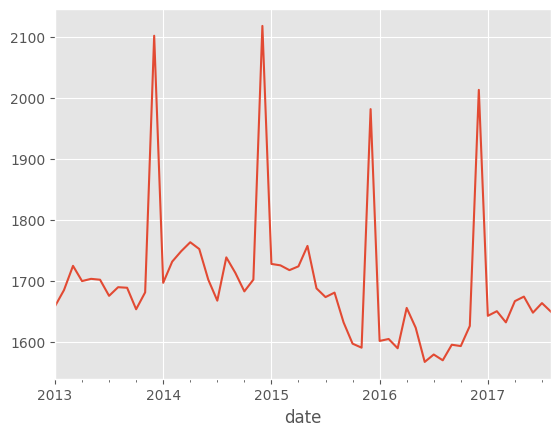

In [9]:
transactions.set_index('date').resample('M').transactions.mean().plot()

<Axes: xlabel='transactions', ylabel='sales'>

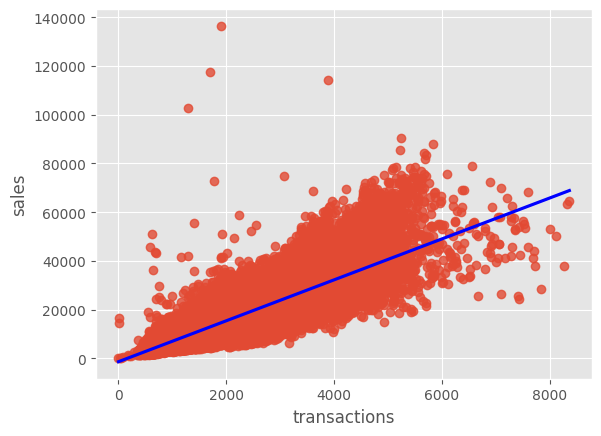

In [10]:
sns.regplot(temp, x = 'transactions', y = 'sales', line_kws = dict(color = 'b'))

<Axes: xlabel='day'>

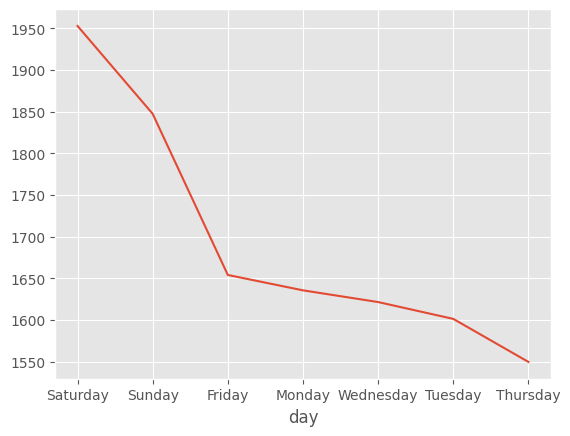

In [11]:
b = transactions.copy()
b['day'] = b['date'].dt.day_name()
b['day']
b.groupby('day')['transactions'].mean().sort_values(ascending = False).plot()

In [12]:
oil['date'] = pd.to_datetime(oil['date'])
a = oil.set_index('date').resample('D').dcoilwtico.mean().reset_index()
a['dcoilwtico'] = np.where(a['dcoilwtico'] == 0, np.nan, a['dcoilwtico'])
a['interpolated'] = a['dcoilwtico'].interpolate()


In [13]:
a = train.groupby(['store_nbr', 'family'], as_index = False).sales.sum().sort_values(by = ['family', 'store_nbr'])
a = a[a['sales'] ==0]
a

,store_nbr,family,sales
1,1,BABY CARE,0.0
397,13,BABY CARE,0.0
727,23,BABY CARE,0.0
1420,44,BABY CARE,0.0
1453,45,BABY CARE,0.0
1486,46,BABY CARE,0.0
1519,47,BABY CARE,0.0
1552,48,BABY CARE,0.0
1585,49,BABY CARE,0.0
1618,50,BABY CARE,0.0


In [14]:
train = train.set_index('id', drop = True)
train

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,2013-01-01,1,BABY CARE,0.000,0
2,2013-01-01,1,BEAUTY,0.000,0
3,2013-01-01,1,BEVERAGES,0.000,0
4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.133,0
3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,2017-08-15,9,PRODUCE,2419.729,148


In [15]:
train

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,2013-01-01,1,BABY CARE,0.000,0
2,2013-01-01,1,BEAUTY,0.000,0
3,2013-01-01,1,BEVERAGES,0.000,0
4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.133,0
3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,2017-08-15,9,PRODUCE,2419.729,148


In [16]:
train.groupby('family', as_index = False).sales.sum()

,family,sales
0,AUTOMOTIVE,5.548220e+05
1,BABY CARE,1.005100e+04
2,BEAUTY,3.378930e+05
3,BEVERAGES,2.169545e+08
4,BOOKS,6.438000e+03
5,BREAD/BAKERY,4.213395e+07
6,CELEBRATION,7.611770e+05
7,CLEANING,9.752129e+07
8,DAIRY,6.448771e+07
9,DELI,2.411032e+07


<Axes: ylabel='family'>

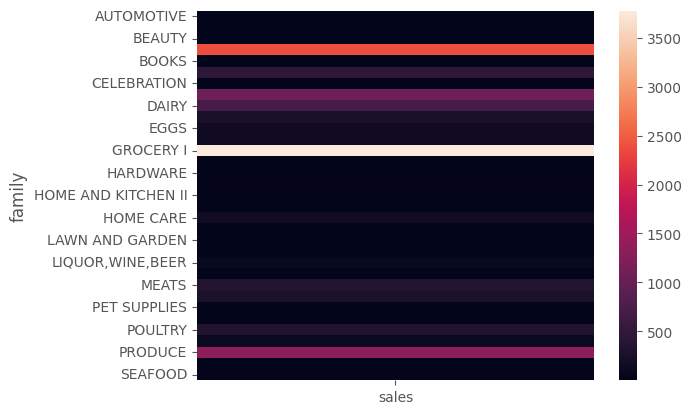

In [17]:
sns.heatmap(pd.pivot_table(train, index= 'family', values = 'sales', aggfunc= 'mean'))

In [18]:
c = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.0
397,13,BABY CARE,0.0
727,23,BABY CARE,0.0
1420,44,BABY CARE,0.0
1453,45,BABY CARE,0.0
1486,46,BABY CARE,0.0
1519,47,BABY CARE,0.0
1552,48,BABY CARE,0.0
1585,49,BABY CARE,0.0
1618,50,BABY CARE,0.0


In [19]:
outer_join = train.merge(c[c.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
train

,date,store_nbr,family,sales,onpromotion
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-02,1,AUTOMOTIVE,2.0,0
2,2013-01-03,1,AUTOMOTIVE,3.0,0
3,2013-01-04,1,AUTOMOTIVE,3.0,0
4,2013-01-05,1,AUTOMOTIVE,5.0,0
...,...,...,...,...,...
3000883,2017-08-11,54,SEAFOOD,0.0,0
3000884,2017-08-12,54,SEAFOOD,1.0,1
3000885,2017-08-13,54,SEAFOOD,2.0,0
3000886,2017-08-14,54,SEAFOOD,0.0,0


In [20]:
a = train.groupby(['store_nbr', 'family'], as_index = False).sales.sum().sort_values(by = 'store_nbr')
b = a[a.sales == 0] 

train = train.drop(train.merge(b, how = 'inner').index, axis = 0)
train

,date,store_nbr,family,sales,onpromotion
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-02,1,AUTOMOTIVE,2.0,0
2,2013-01-03,1,AUTOMOTIVE,3.0,0
3,2013-01-04,1,AUTOMOTIVE,3.0,0
4,2013-01-05,1,AUTOMOTIVE,5.0,0
...,...,...,...,...,...
3000883,2017-08-11,54,SEAFOOD,0.0,0
3000884,2017-08-12,54,SEAFOOD,1.0,1
3000885,2017-08-13,54,SEAFOOD,2.0,0
3000886,2017-08-14,54,SEAFOOD,0.0,0


In [21]:
train.groupby(['store_nbr', 'family'], as_index = False).sales.sum().sort_values(by = 'sales', ascending = True)


,store_nbr,family,sales
1014,32,LAWN AND GARDEN,9.000000e+00
423,14,BABY CARE,1.100000e+01
695,22,LAWN AND GARDEN,1.200000e+01
165,6,BABY CARE,1.200000e+01
809,26,BOOKS,1.400000e+01
...,...,...,...
1381,44,BEVERAGES,1.341786e+07
1454,46,GROCERY I,1.434226e+07
1486,47,GROCERY I,1.551453e+07
1422,45,GROCERY I,1.634975e+07


In [22]:
holidays = pd.read_csv("../input/store-sales-time-series-forecasting/holidays_events.csv")
holidays["date"] = pd.to_datetime(holidays.date)

# holidays[holidays.type == "Holiday"]
# holidays[(holidays.type == "Holiday") & (holidays.transferred == True)]

# Transferred Holidays
tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
holidays = pd.concat([holidays, tr]).reset_index(drop = True)


# Additional Holidays
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Bridge Holidays
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])

 
# Work Day Holidays, that is meant to payback the Bridge.
work_day = holidays[holidays.type == "Work Day"]  
holidays = holidays[holidays.type != "Work Day"]  


# Split

# Events are national
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()



d = pd.merge(pd.concat([train, test]), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# National Holidays & Events
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regional
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Local
d = pd.merge(d, local, how = "left", on = ["date", "city"])

# Work Day: It will be removed when real work day colum created
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")

# EVENTS
events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)

# New features
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

# 
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["family", "city", "state", "type"]] = d[["family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()

d.head(10)


,date,store_nbr,family,sales,onpromotion,id,city,state,type,cluster,...,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Quito1,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga
0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
1,2013-01-02,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
2,2013-01-03,1,AUTOMOTIVE,3.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
3,2013-01-04,1,AUTOMOTIVE,3.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
4,2013-01-05,1,AUTOMOTIVE,5.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
5,2013-01-06,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
6,2013-01-07,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
7,2013-01-08,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
8,2013-01-09,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0
9,2013-01-10,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,0,0,0,0,0,0,0,0,0,0


In [23]:
def AB_Test(df, group, target):
    import scipy.stats as stats 
    from scipy.stats import shapiro
    
    grpA = df[df[group] == 1][target]
    grpB = df[df[group] == 0][target]
    
    # test for normality
    nA = shapiro(grpA)[1] < 0.5
    nB = shapiro(grpB)[1] < 0.5
    
    if (nA == False) and (nB == False):
        #grioups are normal, we test for homogeneity of variences
        
        levene = stats.levene(grpA, grpB)[1]< 0.5
        if levene == False:
            ttest = stats.ttests_ind(grpA, grpB, equal_var = True)[1]< 0.5
        else:
            ttest = stats.ttestz_ind(grpA, grpB, equal_var = False)[1]< 0.5
    else:
        ttest = stats.mannwhitneyu(grpA, grpB)[1] < 0.5
        
    temp = pd.DataFrame({'AB Hypothesis':[ttest < 0.5], 
                         'p-value': [ttest]})
                                          
    temp['Test Type'] = np.where((nA == False) and (nB == False), 'parametric', 'non parametric')
                                          
    temp['AB Hypothesis'] = np.where(temp['AB Hypothesis'] == False, 'fail to reject H0', 'reject H0')
                                          
    temp['Comment'] = np.where(temp['AB Hypothesis'] == 'fail to reject H0', 'ab groups are similar', 'ab groups are not similar')
                                          
    temp["Feature"] = group
    temp["GroupA_mean"] = grpA.mean()
    temp["GroupB_mean"] = grpB.mean()
    temp["GroupA_median"] = grpA.median()
    temp["GroupB_median"] = grpB.median()
                                          
    if (nA == False) & (nB == False):
        temp["Homogeneity"] = np.where(leveneTest == False, "Yes", "No")
        temp = temp[["Feature","Test Type", "Homogeneity","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    else:
        temp = temp[["Feature","Test Type","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    
    # Print Hypothesis
    # print("# A/B Testing Hypothesis")
    # print("H0: A == B")
    # print("H1: A != B", "\n")
    
    return temp 



he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
ab = []
for i in he_cols:
    ab.append(AB_Test(df=d[d.sales.notnull()], group = i, target = "sales"))
ab = pd.concat(ab)
ab

,Feature,Test Type,AB Hypothesis,p-value,Comment,GroupA_mean,GroupB_mean,GroupA_median,GroupB_median
0,events_Black_Friday,non parametric,fail to reject H0,True,ab groups are similar,374.499006,368.808585,20.0,13.0
0,events_Cyber_Monday,non parametric,fail to reject H0,True,ab groups are similar,449.591952,368.674661,20.0,13.0
0,events_Dia_de_la_Madre,non parametric,fail to reject H0,True,ab groups are similar,359.220389,368.847279,11.0,13.0
0,events_Futbol,non parametric,fail to reject H0,True,ab groups are similar,320.497332,369.223527,6.0,13.0
0,events_Terremoto_Manabi,non parametric,fail to reject H0,True,ab groups are similar,498.624345,368.741640,36.0,13.0
...,...,...,...,...,...,...,...,...,...
0,holiday_local_Independencia_de_Latacunga,non parametric,fail to reject H0,True,ab groups are similar,178.586690,368.835170,11.0,13.0
0,national_independence,non parametric,fail to reject H0,True,ab groups are similar,426.144719,368.199773,16.0,13.0
0,local_cantonizacio,non parametric,fail to reject H0,True,ab groups are similar,368.464408,469.001700,13.0,18.0
0,local_fundacion,non parametric,fail to reject H0,True,ab groups are similar,368.916817,235.847955,13.0,10.0


In [24]:
def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.isocalendar().week).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df
d = create_date_features(d)




# Workday column
d["workday"] = np.where((d.holiday_national_binary == 1) | (d.holiday_local_binary==1) | (d.holiday_regional_binary==1) | (d['day_of_week'].isin([6,7])), 0, 1)
d["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, d["workday"])).astype("int8")
d.drop("IsWorkDay", axis = 1, inplace = True)

# Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. 
# Supermarket sales could be affected by this.
d["wageday"] = pd.Series(np.where((d['is_month_end'] == 1) | (d["day_of_month"] == 15), 1, 0)).astype("int8")

d.head(15)


,date,store_nbr,family,sales,onpromotion,id,city,state,type,cluster,...,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,...,1,1,0,1,0,1,0,0,0,0
1,2013-01-02,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
2,2013-01-03,1,AUTOMOTIVE,3.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
3,2013-01-04,1,AUTOMOTIVE,3.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
4,2013-01-05,1,AUTOMOTIVE,5.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
5,2013-01-06,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,0,0
6,2013-01-07,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
7,2013-01-08,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
8,2013-01-09,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0
9,2013-01-10,1,AUTOMOTIVE,2.0,0,NaN,Quito,Pichincha,D,13,...,1,0,0,0,0,0,0,0,1,0


In [25]:
d[d['month'].isin([3, 4])].groupby('year').sales.sum()

year
2013    2.242196e+07
2014    3.322684e+07
2015    3.055368e+07
2016    4.909481e+07
2017    5.259933e+07
Name: sales, dtype: float64

In [26]:
d[d['month'].isin([3])].groupby(['year', 'family']).sales.mean().unstack()

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,
2013,4.560932,0.000000,2.330346,1088.542413,0.000000,354.853526,0.000000,899.277180,365.894863,195.494296,...,0.000000,313.938676,190.713262,0.000000,0.000000,190.441733,90.362182,2.411589,0.000000,23.941057
2014,6.042413,0.055300,3.086022,2646.471924,0.000000,388.987692,12.830346,1057.511350,709.575269,227.415349,...,1.170251,332.993349,231.297491,4.785544,9.594385,390.943043,97.848576,2002.596327,1.335125,23.890751
2015,6.902031,0.000000,2.538232,1385.922342,0.000000,500.669417,0.000000,1115.107527,737.664875,301.454903,...,0.000000,326.473811,289.569892,0.000000,0.000000,384.931138,95.655186,4.124851,0.000000,26.169936
2016,7.203106,0.339478,4.261051,2967.511947,0.000000,492.651516,13.970131,1057.762843,843.405018,272.667234,...,5.959976,324.644176,290.982676,5.780765,8.557945,368.022836,107.821004,2262.134630,1.922342,23.449707
2017,7.642772,0.339478,4.212067,3664.010155,0.585608,573.421241,13.947431,1197.510753,972.788530,320.441513,...,6.161888,367.350973,325.296894,8.627838,11.180406,388.023902,111.916694,2396.963142,4.925926,25.063907


In [27]:
d[d.month.isin([4, 5])].groupby(['year', 'family']).sales.mean().unstack()

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,
2013,5.014876,0.000000,2.242259,1082.952034,0.000000,359.644466,0.000000,882.671828,350.712508,201.413805,...,0.000000,324.426293,192.935641,0.000000,0.000000,190.306378,83.029393,4.597450,0.000000,21.784354
2014,5.009411,0.000000,2.277171,1273.498179,0.000000,362.751029,0.000000,895.743169,667.948087,220.910857,...,0.000000,315.064507,232.140559,0.000000,0.000000,353.101281,90.148191,4.931998,0.000000,20.587511
2015,5.578628,0.000000,2.744384,1773.299029,0.000000,510.743057,0.000000,1136.955677,751.210686,305.372233,...,1.560413,338.189490,291.105647,0.056466,0.000000,384.711418,94.849472,5.262599,0.000000,25.042594
2016,7.125076,0.320062,4.782332,3306.877656,0.000000,541.683519,13.982696,1195.784153,894.969945,293.737588,...,6.649362,356.768421,356.734973,6.716151,10.471767,391.973237,106.654130,2263.000637,5.882514,24.095966
2017,7.585610,0.225215,5.272010,3572.213722,0.258512,554.622325,13.642684,1300.468731,965.250152,321.342451,...,6.828780,360.316119,324.120826,9.014268,12.149059,383.165297,95.756706,2391.040075,11.641469,23.038335


In [28]:
import statsmodels.api as sm

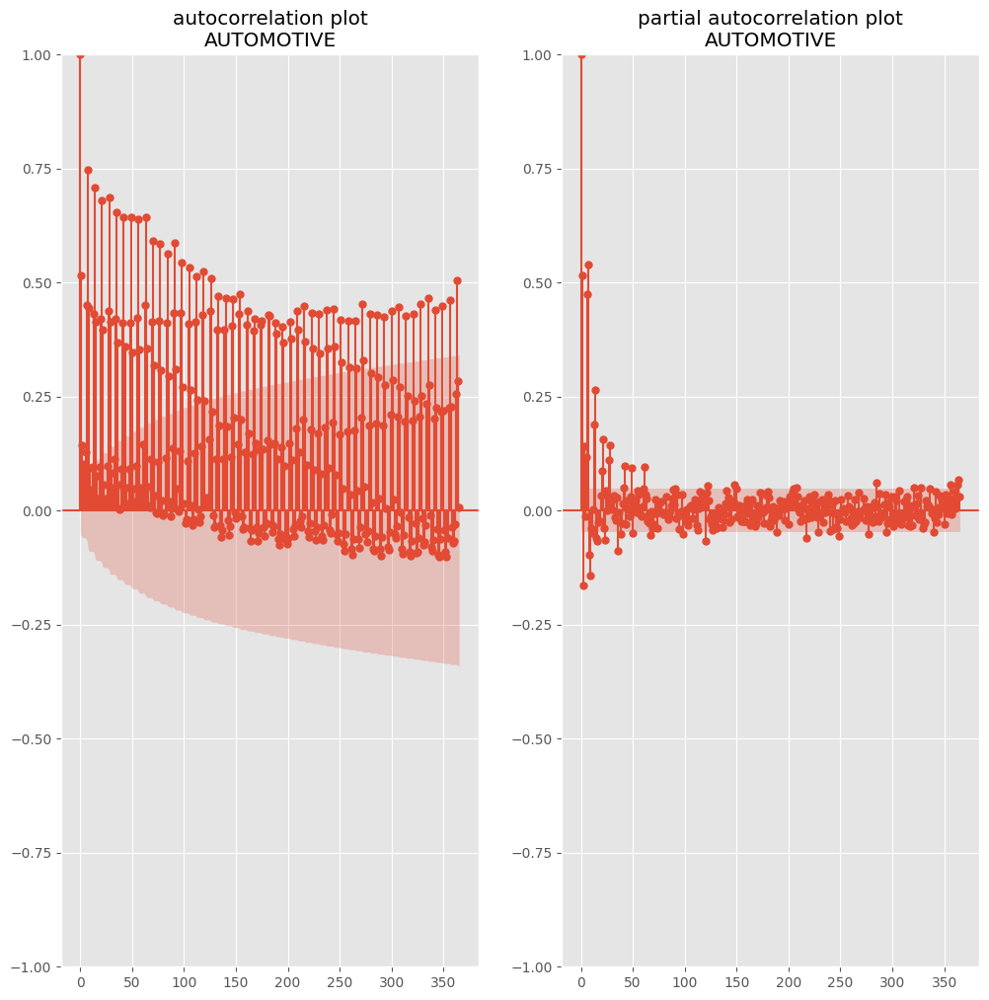

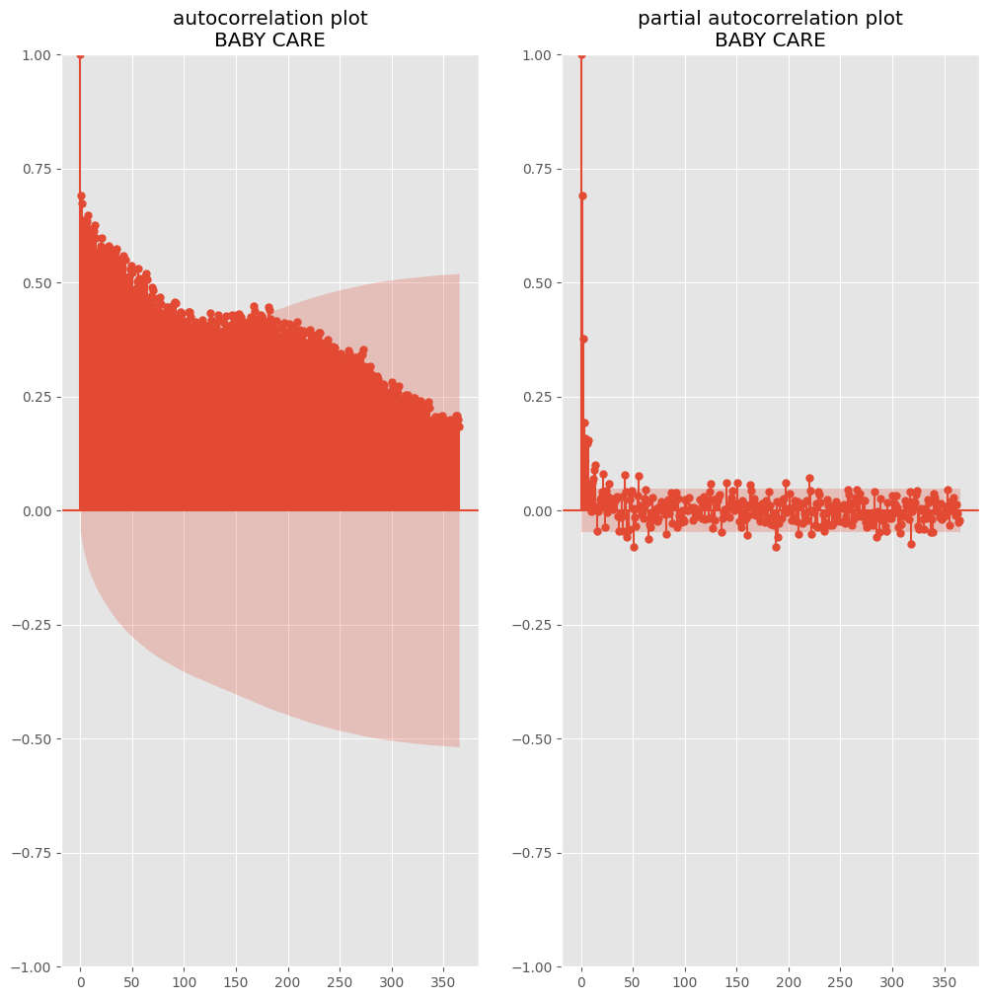

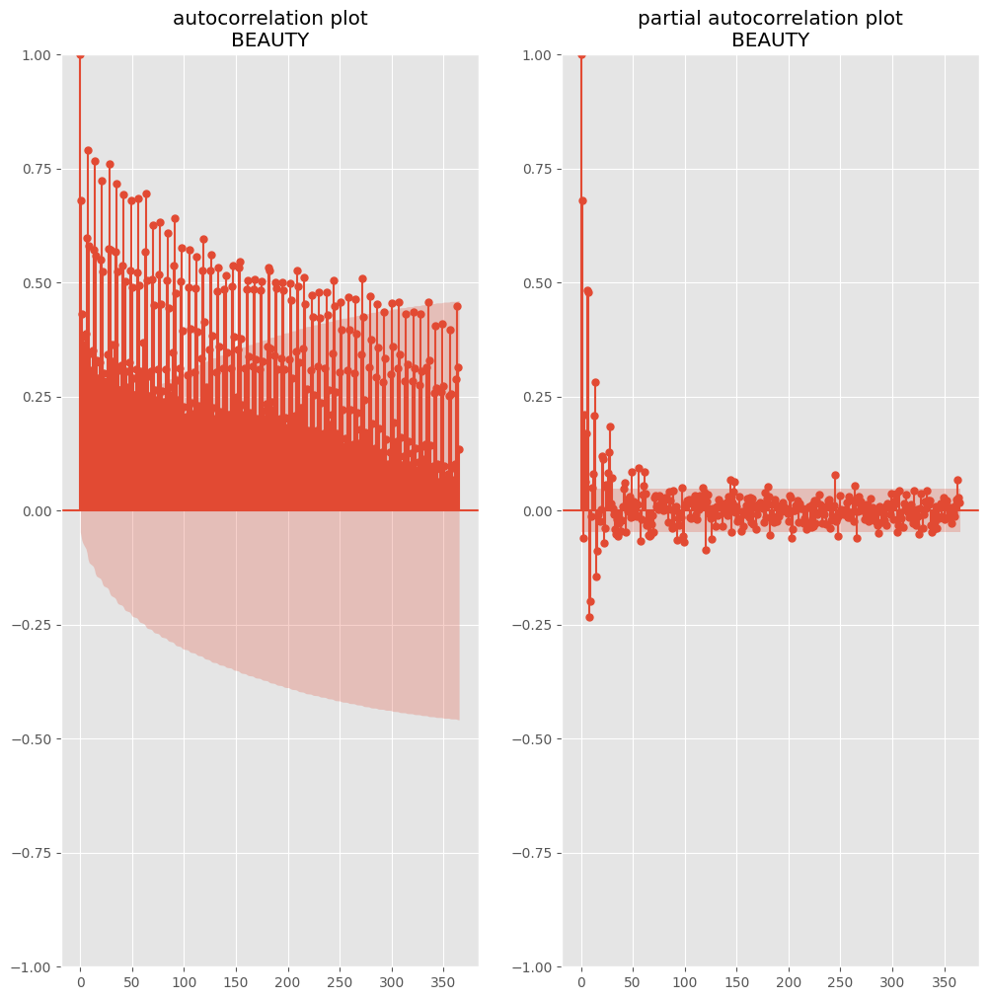

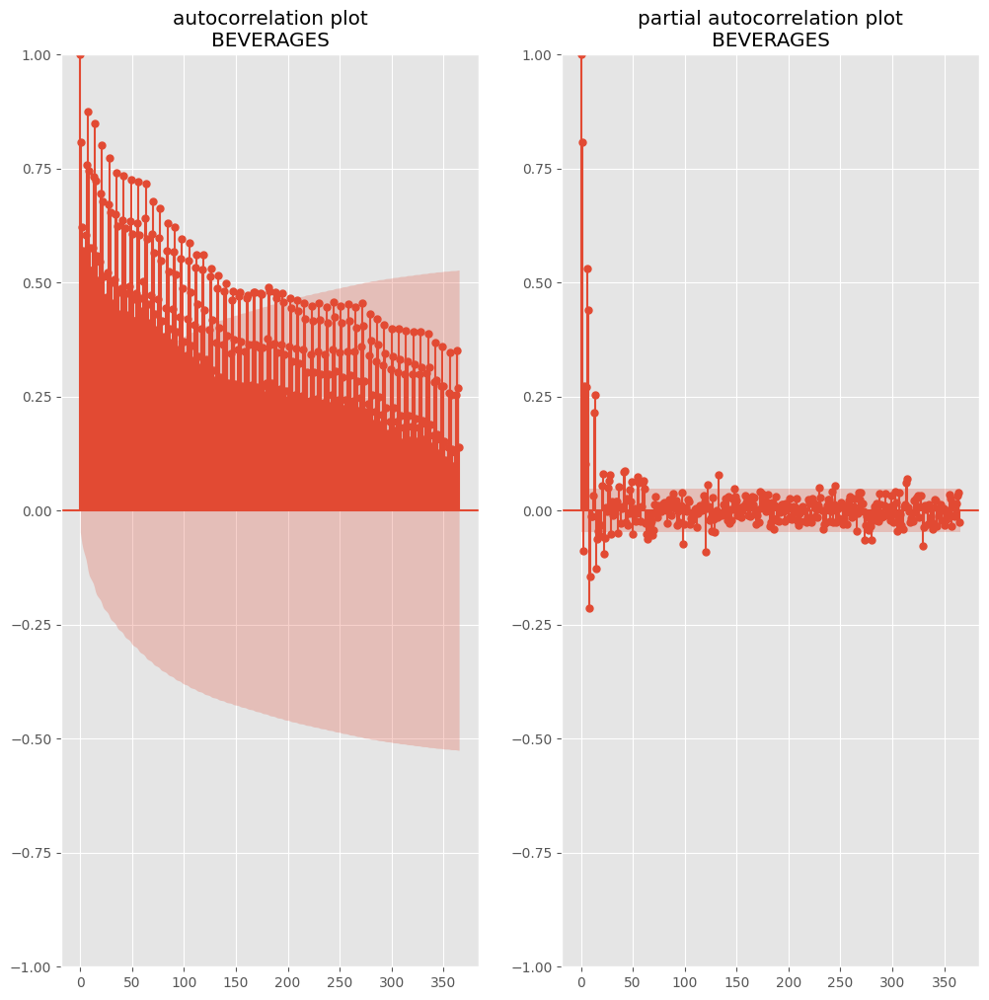

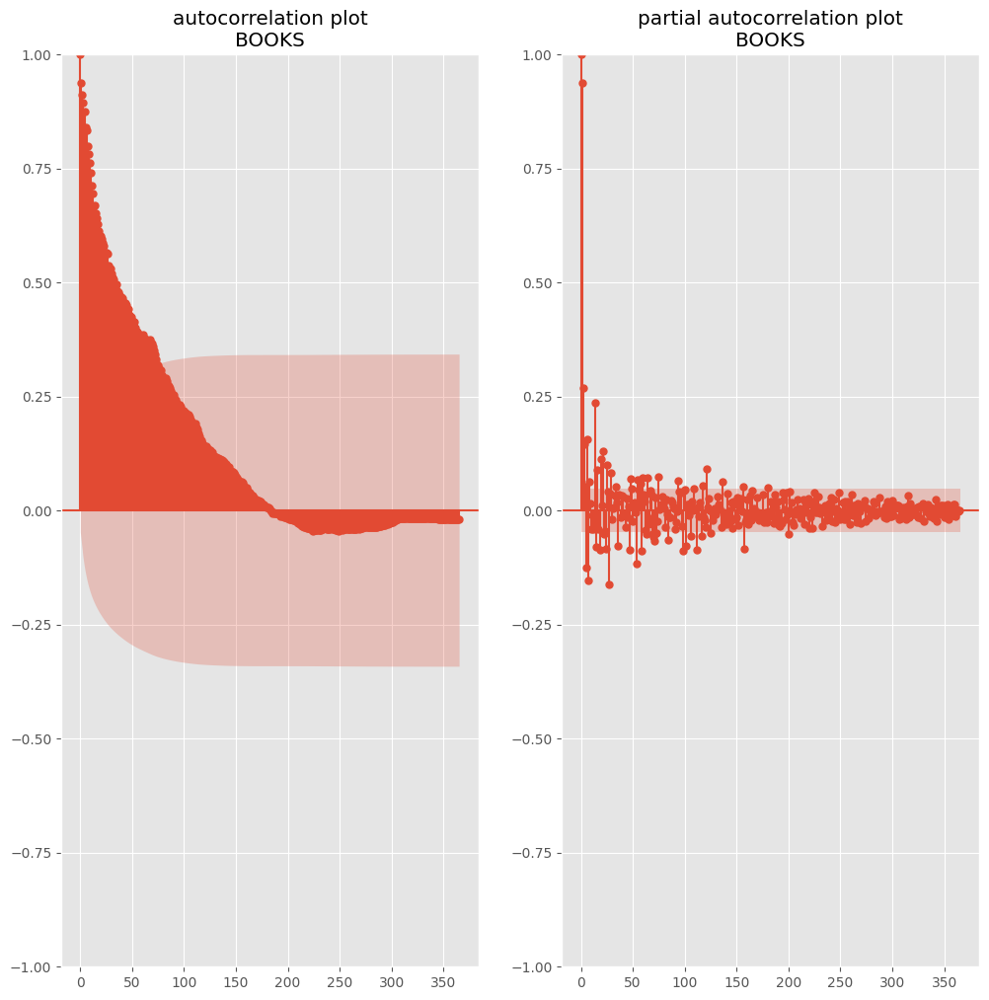

...

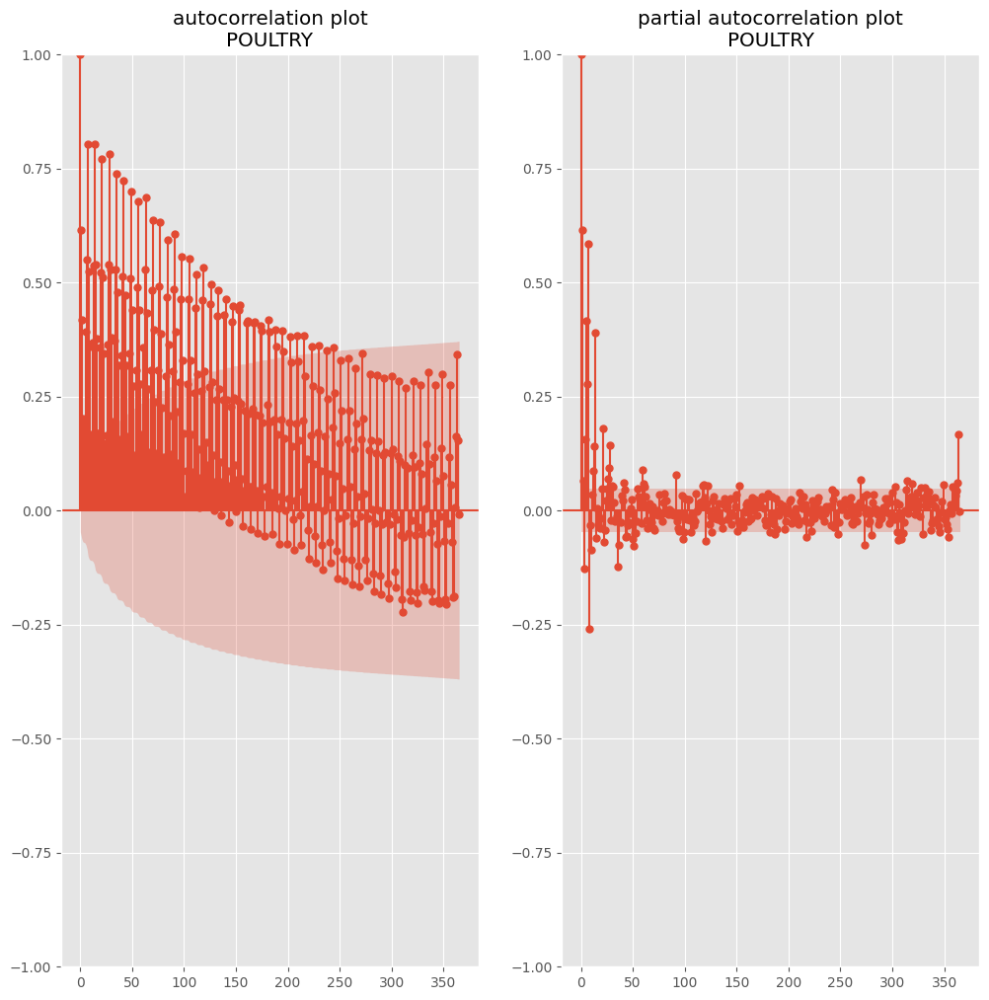

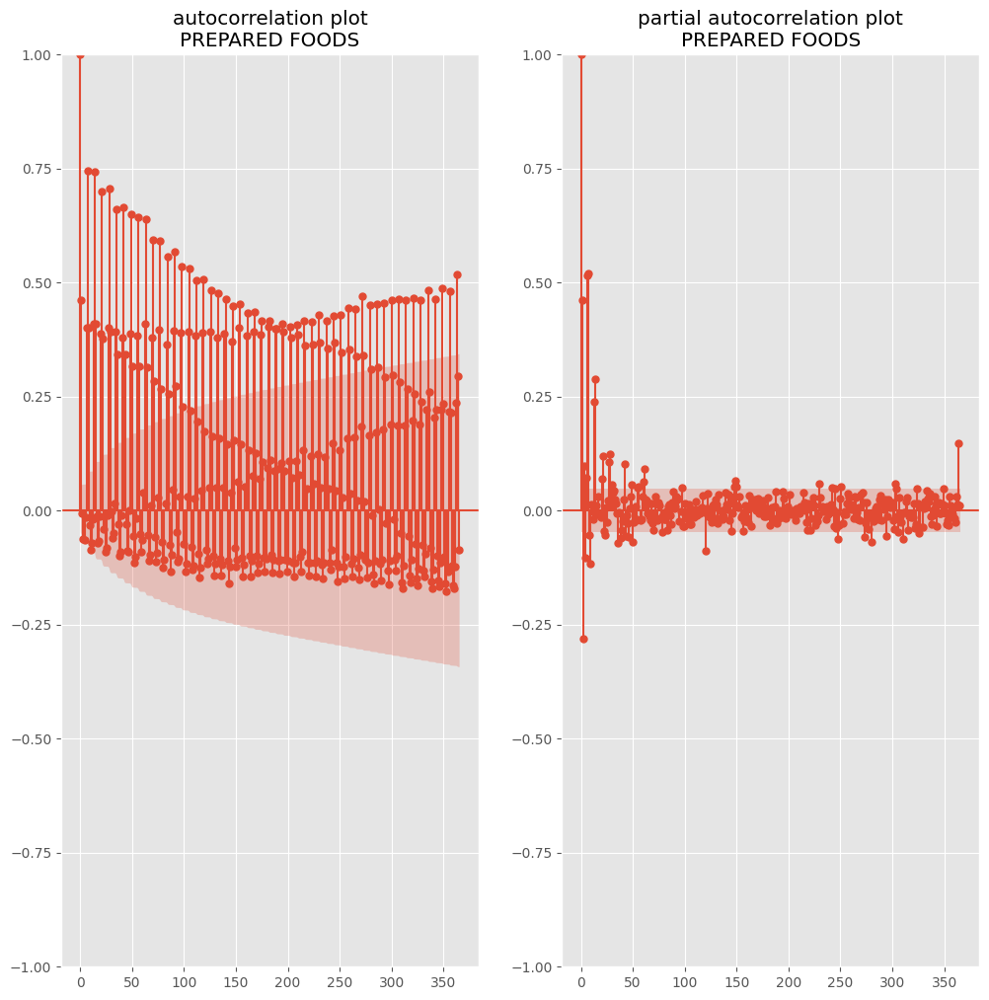

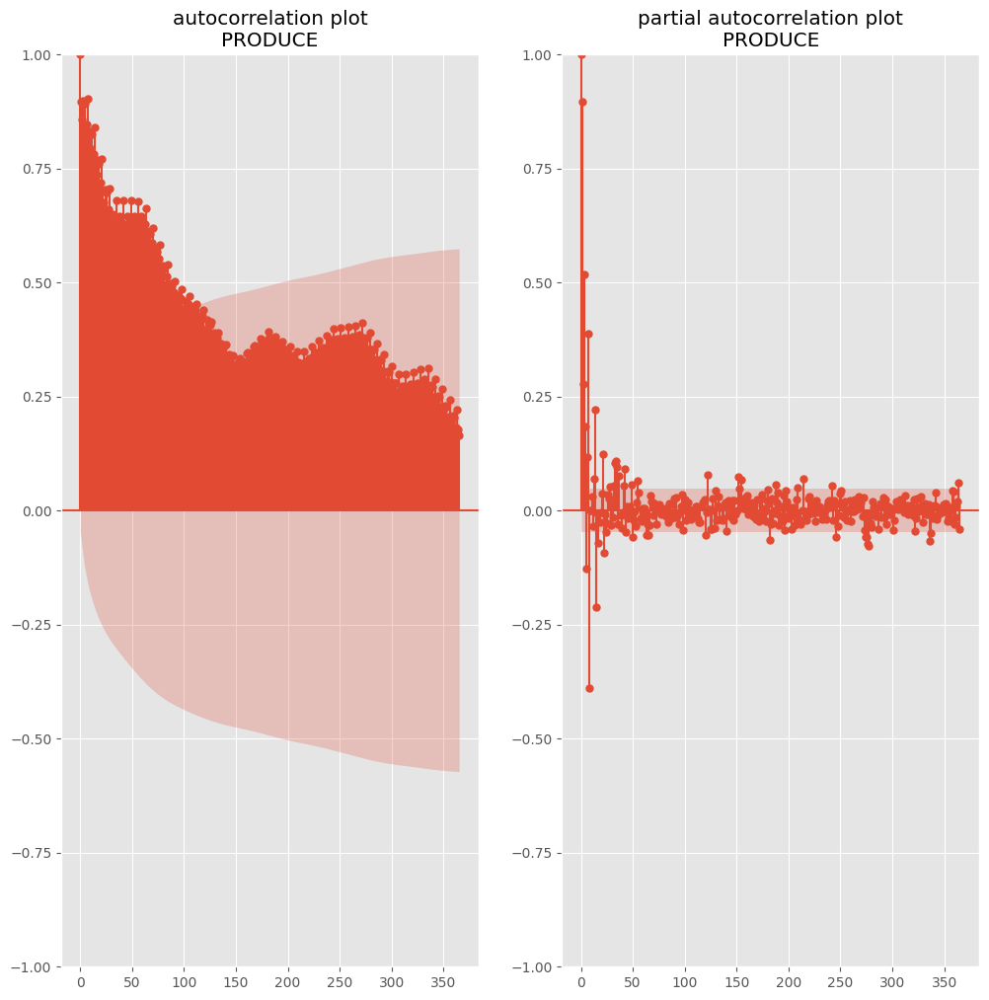

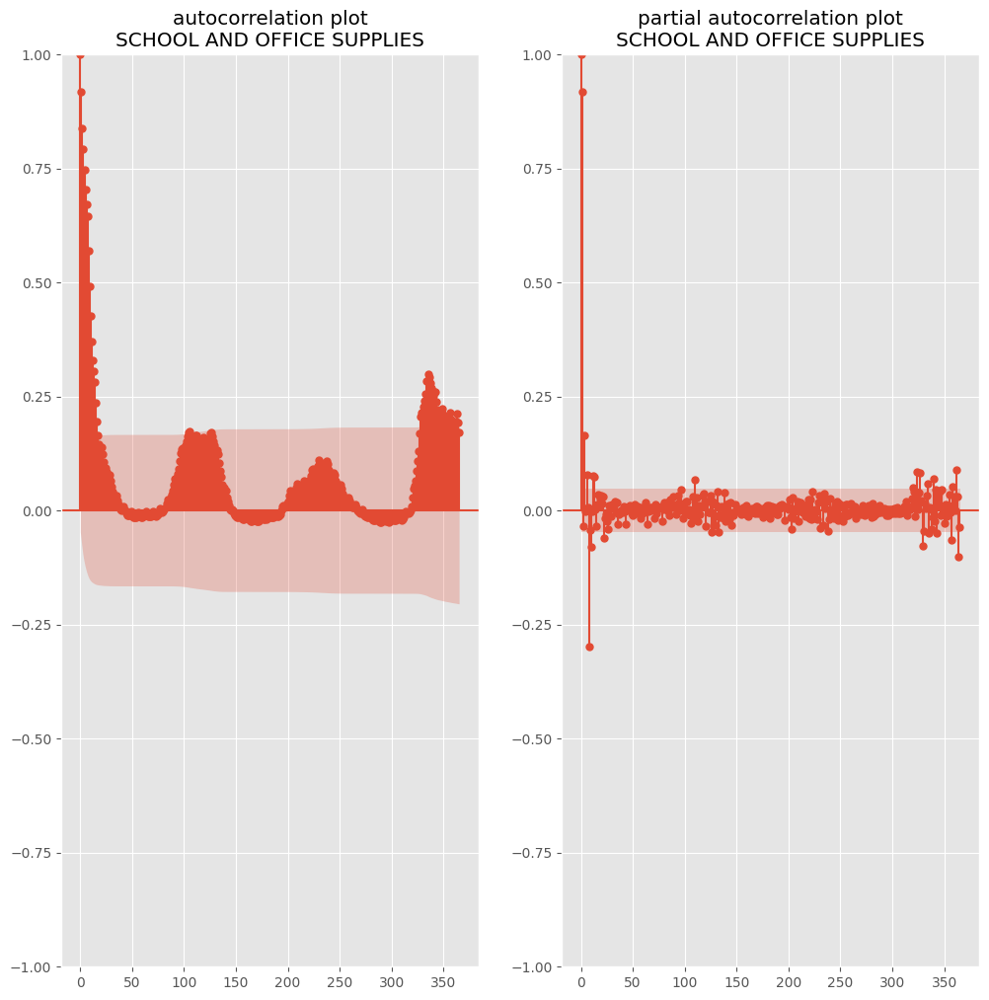

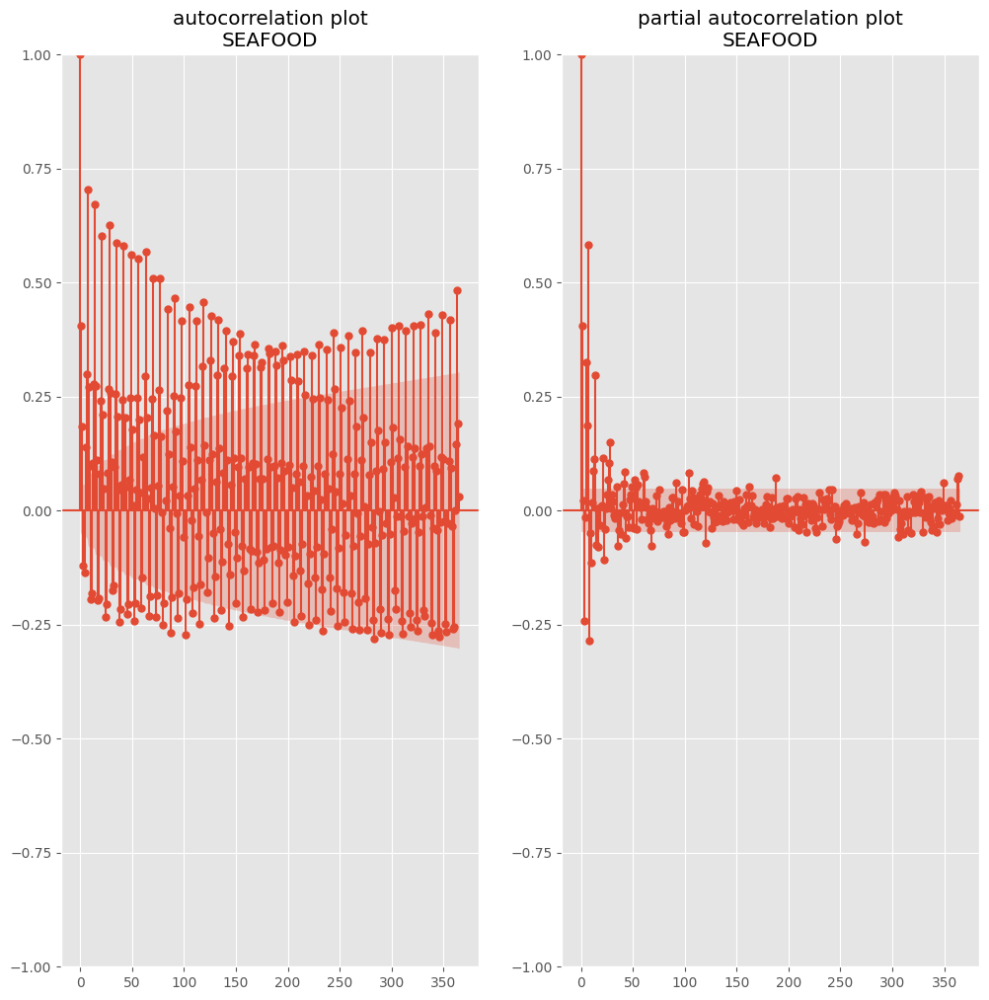

In [29]:
a = d[d.sales.notnull()].groupby(['date', 'family'], as_index = False).sales.mean().set_index('date')
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1, 2, figsize = (12, 12))
        temp = a[a.family == i]
        sm.graphics.tsa.plot_acf(temp.sales, lags = 365, ax = ax[0], title = 'autocorrelation plot\n' + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags = 365, ax = ax[1], title = 'partial autocorrelation plot\n' + i)
    except:
        pass
        
        
        

<Axes: xlabel='day_of_year', ylabel='sales'>

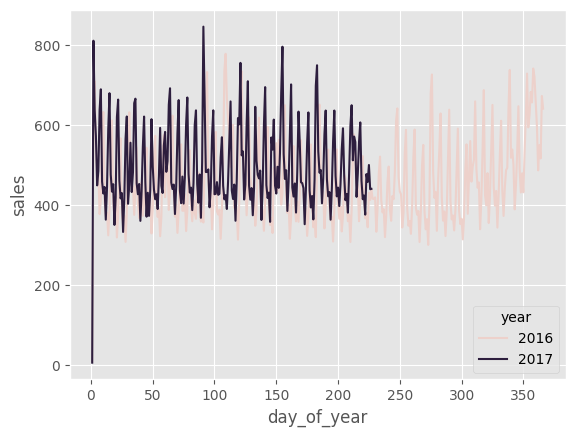

In [30]:
c = d[d.year.isin([2016, 2017])].groupby(['year', 'day_of_year'], as_index = False).sales.mean()
sns.lineplot(c, x = 'day_of_year', y = 'sales', hue = 'year')

In [31]:
a = train.sort_values(["store_nbr", "family", "date"])
for i in [20, 30, 45, 60, 90, 120, 365, 730]:
    a["SMA"+str(i)+"_sales_lag16"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().values
    a["SMA"+str(i)+"_sales_lag30"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().values
    a["SMA"+str(i)+"_sales_lag60"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().values
print("Correlation")
a[["sales"]+a.columns[a.columns.str.startswith("SMA")].tolist()].corr()

Correlation


,sales,SMA20_sales_lag16,SMA20_sales_lag30,SMA20_sales_lag60,SMA30_sales_lag16,SMA30_sales_lag30,SMA30_sales_lag60,SMA45_sales_lag16,SMA45_sales_lag30,SMA45_sales_lag60,...,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60
sales,1.000000,0.937777,0.937777,0.937777,0.936237,0.936237,0.936237,0.931150,0.931150,0.931150,...,0.924689,0.921234,0.921234,0.921234,0.912578,0.912578,0.912578,0.915535,0.915535,0.915535
SMA20_sales_lag16,0.937777,1.000000,1.000000,1.000000,0.997381,0.997381,0.997381,0.992844,0.992844,0.992844,...,0.985392,0.980745,0.980745,0.980745,0.969702,0.969702,0.969702,0.970431,0.970431,0.970431
SMA20_sales_lag30,0.937777,1.000000,1.000000,1.000000,0.997381,0.997381,0.997381,0.992844,0.992844,0.992844,...,0.985392,0.980745,0.980745,0.980745,0.969702,0.969702,0.969702,0.970431,0.970431,0.970431
SMA20_sales_lag60,0.937777,1.000000,1.000000,1.000000,0.997381,0.997381,0.997381,0.992844,0.992844,0.992844,...,0.985392,0.980745,0.980745,0.980745,0.969702,0.969702,0.969702,0.970431,0.970431,0.970431
SMA30_sales_lag16,0.936237,0.997381,0.997381,0.997381,1.000000,1.000000,1.000000,0.997391,0.997391,0.997391,...,0.989992,0.985610,0.985610,0.985610,0.973694,0.973694,0.973694,0.972807,0.972807,0.972807
SMA30_sales_lag30,0.936237,0.997381,0.997381,0.997381,1.000000,1.000000,1.000000,0.997391,0.997391,0.997391,...,0.989992,0.985610,0.985610,0.985610,0.973694,0.973694,0.973694,0.972807,0.972807,0.972807
SMA30_sales_lag60,0.936237,0.997381,0.997381,0.997381,1.000000,1.000000,1.000000,0.997391,0.997391,0.997391,...,0.989992,0.985610,0.985610,0.985610,0.973694,0.973694,0.973694,0.972807,0.972807,0.972807
SMA45_sales_lag16,0.931150,0.992844,0.992844,0.992844,0.997391,0.997391,0.997391,1.000000,1.000000,1.000000,...,0.994515,0.990782,0.990782,0.990782,0.978094,0.978094,0.978094,0.975269,0.975269,0.975269
SMA45_sales_lag30,0.931150,0.992844,0.992844,0.992844,0.997391,0.997391,0.997391,1.000000,1.000000,1.000000,...,0.994515,0.990782,0.990782,0.990782,0.978094,0.978094,0.978094,0.975269,0.975269,0.975269
SMA45_sales_lag60,0.931150,0.992844,0.992844,0.992844,0.997391,0.997391,0.997391,1.000000,1.000000,1.000000,...,0.994515,0.990782,0.990782,0.990782,0.978094,0.978094,0.978094,0.975269,0.975269,0.975269


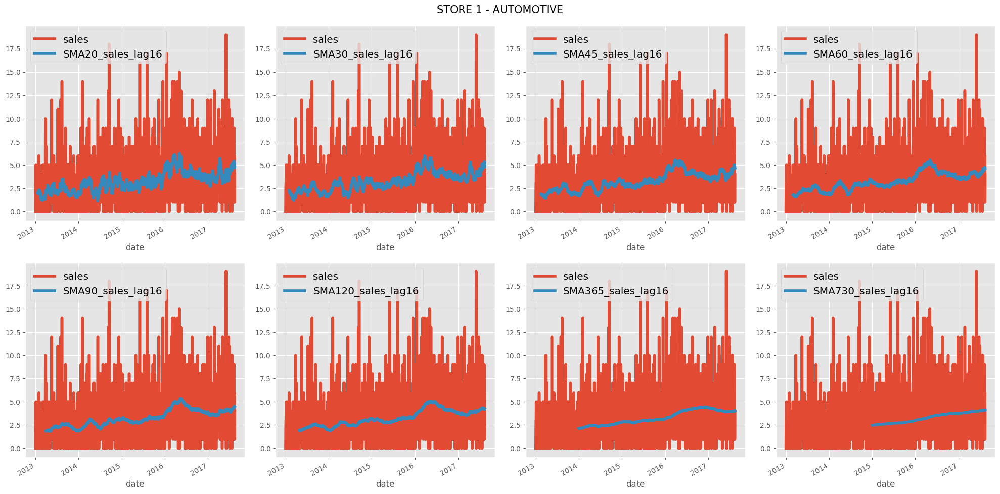

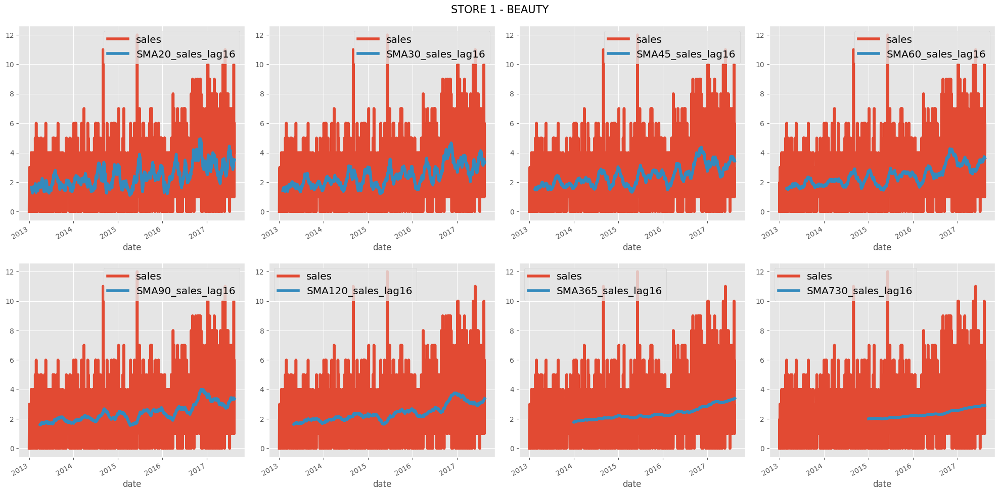

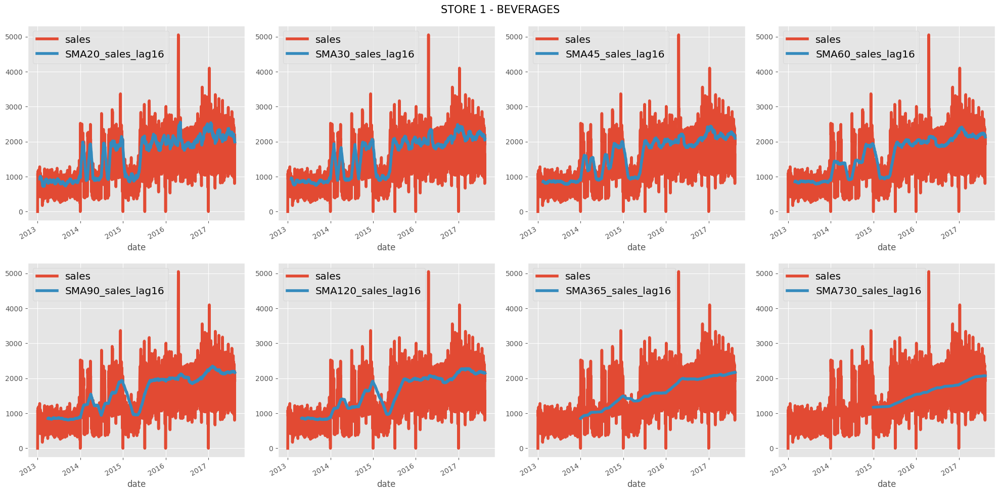

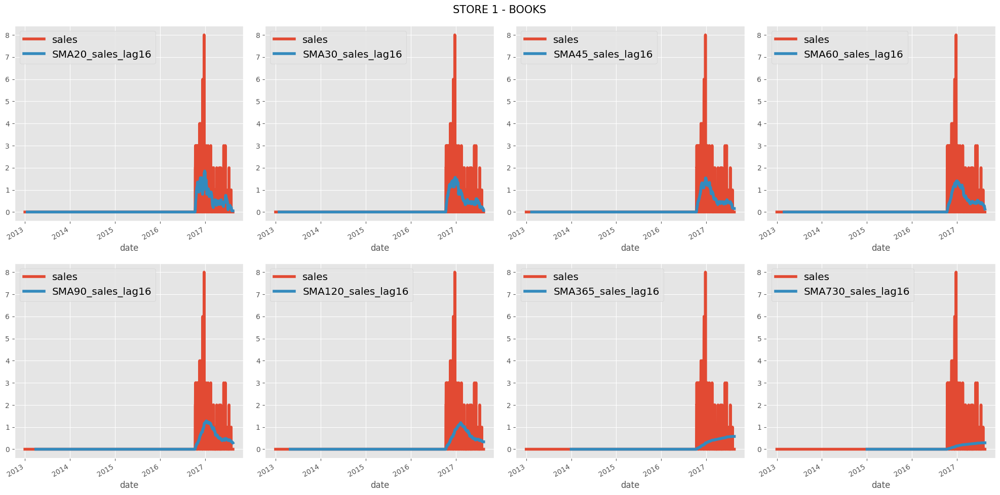

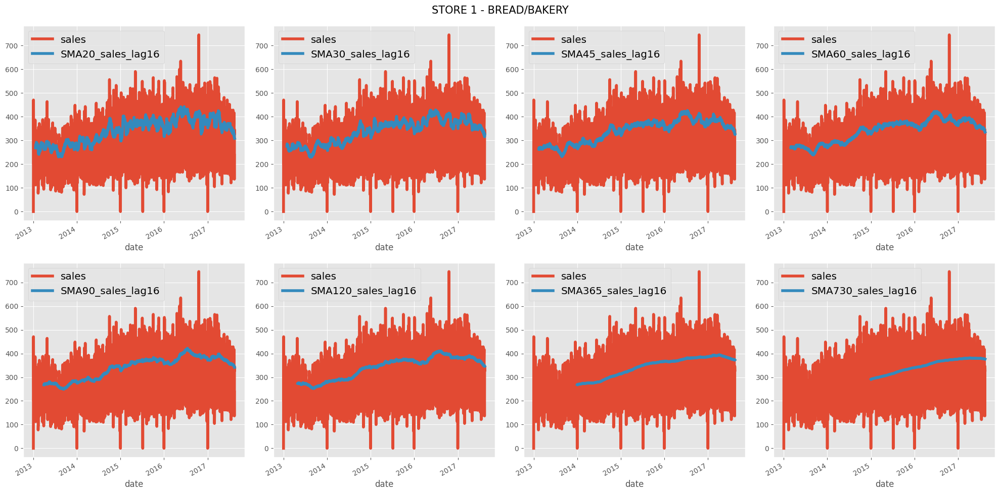

...

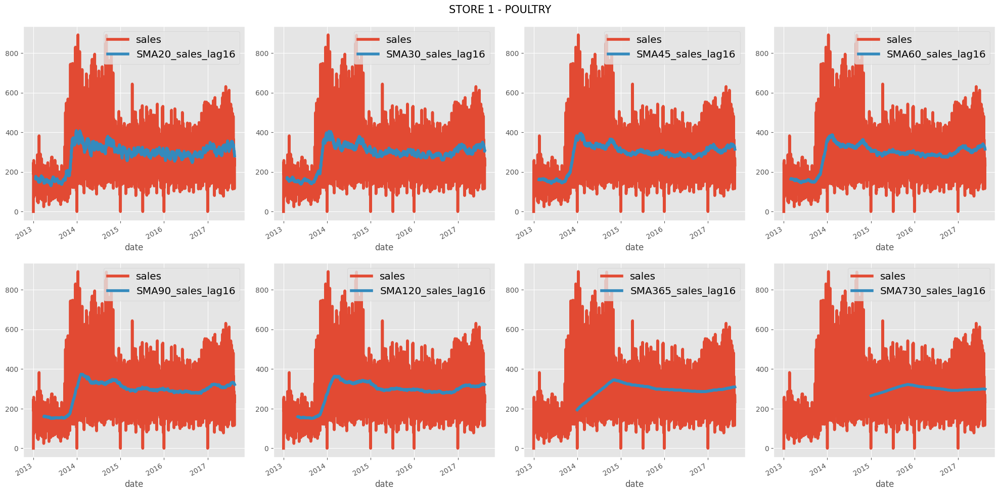

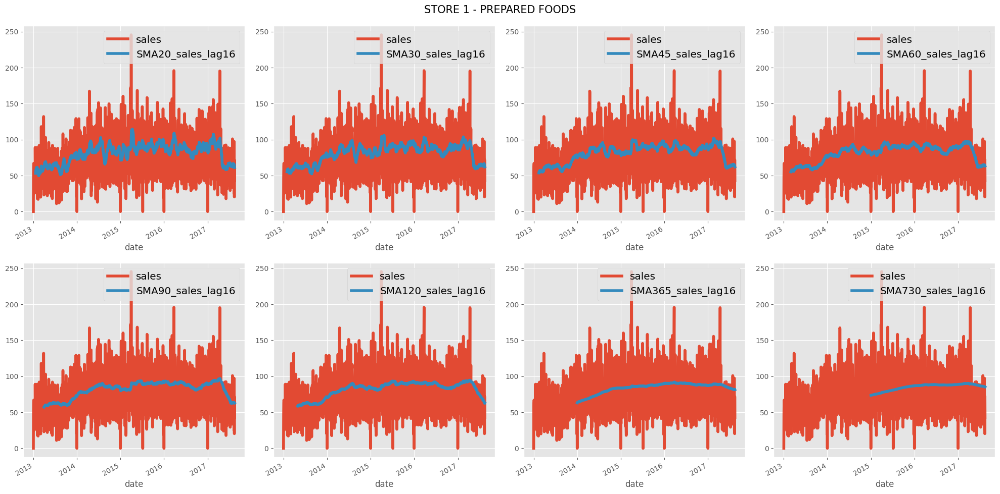

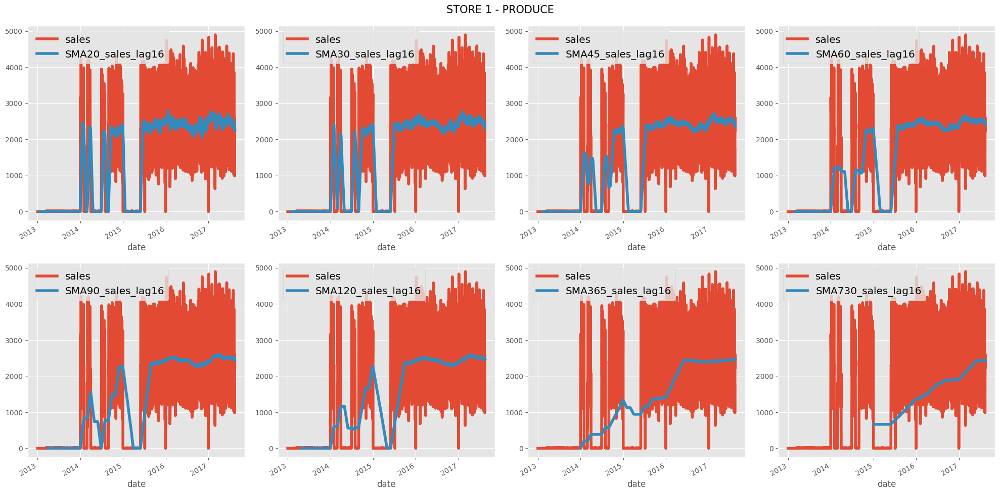

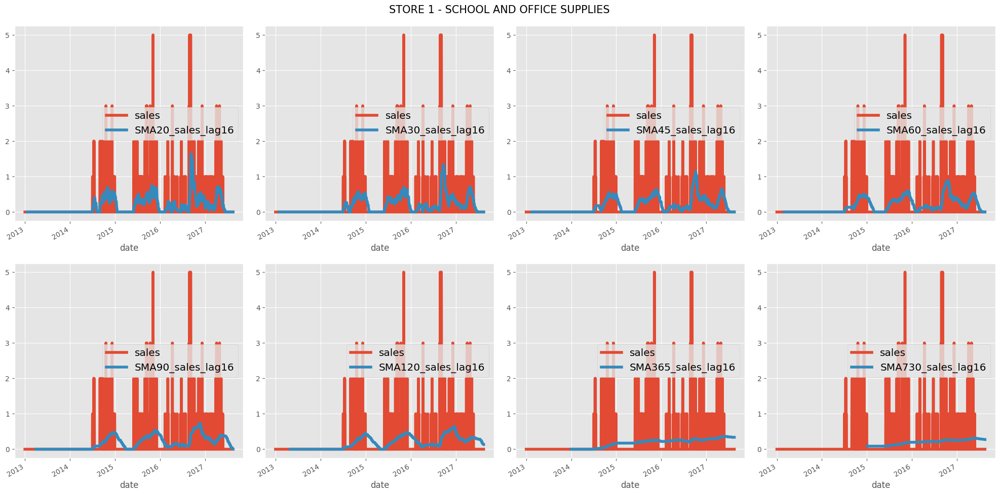

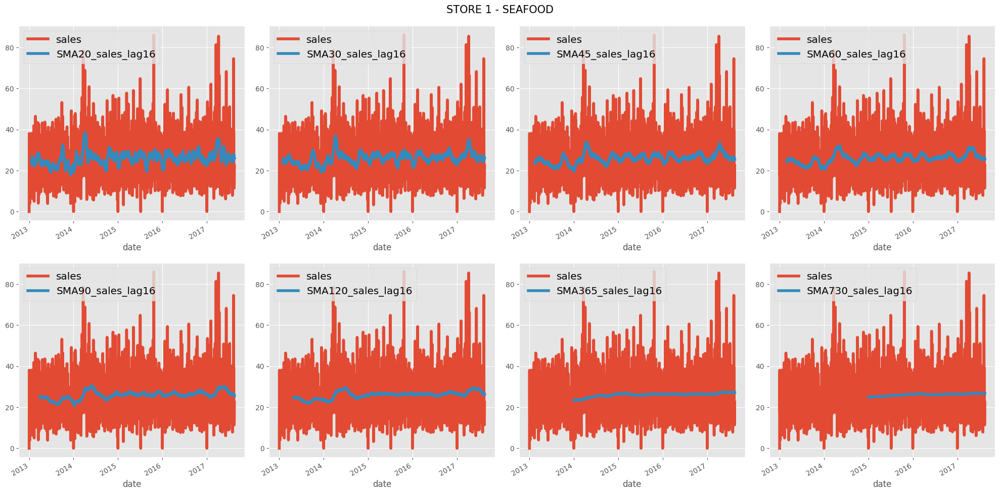

In [32]:
b = a[(a.store_nbr == 1)].set_index("date")
for i in b.family.unique():
    fig, ax = plt.subplots(2,4,figsize=(20,10))
    b[b.family == i][["sales", "SMA20_sales_lag16"]].plot(legend = True, ax = ax[0,0], linewidth = 4)
    b[b.family == i][["sales", "SMA30_sales_lag16"]].plot(legend = True, ax = ax[0,1], linewidth = 4)
    b[b.family == i][["sales", "SMA45_sales_lag16"]].plot(legend = True, ax = ax[0,2], linewidth = 4)
    b[b.family == i][["sales", "SMA60_sales_lag16"]].plot(legend = True, ax = ax[0,3], linewidth = 4)
    b[b.family == i][["sales", "SMA90_sales_lag16"]].plot(legend = True, ax = ax[1,0], linewidth = 4)
    b[b.family == i][["sales", "SMA120_sales_lag16"]].plot(legend = True, ax = ax[1,1], linewidth = 4)
    b[b.family == i][["sales", "SMA365_sales_lag16"]].plot(legend = True, ax = ax[1,2], linewidth = 4)
    b[b.family == i][["sales", "SMA730_sales_lag16"]].plot(legend = True, ax = ax[1,3], linewidth = 4)
    plt.suptitle("STORE 1 - "+i, fontsize = 15)
    plt.tight_layout(pad = 1.5)
    for j in range(0,4):
        ax[0,j].legend(fontsize="x-large")
        ax[1,j].legend(fontsize="x-large")
    plt.show()